In [1]:
target_class = 'genre_action'

In [2]:
# from tensorflow import stop_gradient
# from tensorflow import gradients
# from tensorflow import gradients
# import tensorflow

In [3]:
import csv
import numpy as np
import pandas as pd
import scipy
import os
import re
import sklearn

import matplotlib.pyplot as plt
from matplotlib import cm, transforms

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# from tensorflow import set_random_seed
# from tensorflow.keras import backend
from keras import backend
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Embedding, Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, MaxPool2D, Dense, Input, GlobalMaxPooling1D, Dropout, Concatenate, Flatten
from keras.models import Model
from keras.layers.core import Reshape
# from tensorflow.keras.layers import Reshape
from keras import regularizers
from sklearn.model_selection import train_test_split
from keras.callbacks import ModelCheckpoint
from keras.initializers import Constant
from keras.optimizers import Adam

Using TensorFlow backend.


In [4]:
# import csv
# import numpy as np
# import pandas as pd
# import scipy
# import os
# import re
# import sklearn

# import matplotlib.pyplot as plt
# from matplotlib import cm, transforms

# from sklearn.metrics import confusion_matrix
# from sklearn.metrics import classification_report

# # from tensorflow import set_random_seed
# # from tensorflow.keras import backend
# from tensorflow.keras.preprocessing.text import Tokenizer
# from tensorflow.keras.preprocessing.sequence import pad_sequences
# from tensorflow.keras.layers import Embedding, Conv1D, Conv2D, MaxPooling1D, MaxPooling2D, MaxPool2D, Dense, Input, GlobalMaxPooling1D, Dropout, Concatenate, Flatten
# from tensorflow.keras.models import Model
# # from keras.layers.core import Reshape
# from tensorflow.keras.layers import Reshape
# from tensorflow.keras import regularizers
# from sklearn.model_selection import train_test_split
# from tensorflow.keras.callbacks import ModelCheckpoint
# from tensorflow.keras.initializers import Constant
# from tensorflow.keras.optimizers import Adam

In [5]:
import innvestigate
import innvestigate.applications
import innvestigate.applications.mnist
import innvestigate.utils as iutils
import innvestigate.utils.visualizations as ivis
from innvestigate.utils.tests.networks import base as network_base

In [6]:
path = 'C:\\Users\\Sh\\Desktop\\IMDB_Plots'
# path = '/home/mh/IMDB/'
os.chdir(path)

## Loading the data

In [7]:
data = pd.read_csv('_data_v2_clean.csv')

In [8]:
labels = data[['genre_drama', 'genre_comedy', 'genre_action', 'genre_romance', 'genre_crime', 'genre_sci_fi']]
data = data['text']


In [9]:
data0 = data[labels[target_class] ==0]
data1 = data[labels[target_class] ==1]

label0 = labels[labels[target_class] == 0]
label1 = labels[labels[target_class] == 1]

m = np.min([label0.shape[0], label1.shape[0]], axis = 0)

# making balanced set
data0, _, label0, _ = train_test_split(data0, label0, test_size= 1 - (label1.shape[0] / label0.shape[0]) , random_state=42)

data = np.concatenate([data0, data1], axis = 0)
labels = pd.concat([label0, label1], axis = 0)


In [10]:
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.15, random_state=42)
print(np.sum(y_train, axis = 0))
print(np.sum(y_test, axis = 0))

genre_drama       644
genre_comedy      554
genre_action     1442
genre_romance     220
genre_crime       155
genre_sci_fi      144
dtype: int64
genre_drama      116
genre_comedy      93
genre_action     216
genre_romance     41
genre_crime       24
genre_sci_fi      29
dtype: int64


# Tokenizing the data, and making the dictionart

In [11]:
NUM_WORDS = 50000 # Max number of words to embed
tokenizer = Tokenizer(num_words=NUM_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\\]^_`{|}~\t\n', lower=True)
tokenizer.fit_on_texts(data)
unique_words = tokenizer.word_index

In [12]:
w = csv.writer(open('___dict.csv', 'w'))
for key, val in unique_words.items():
    try:
        w.writerow([key, val])
    except:
        w.writerow(['unkwown_word'+str(val), val])

In [13]:
train_data = tokenizer.texts_to_sequences(X_train)
test_data  = tokenizer.texts_to_sequences(X_test)

In [14]:
pad_size = 250
train_data = pad_sequences(train_data, maxlen = pad_size)
test_data  = pad_sequences(test_data , maxlen = pad_size)

## Loading ConceptNet NumberBatch pre-trained vectors

In [15]:
Embedding_Dim = 300
exceptions = 0
embeddings_index = {}

with open('numberbatch-en-17.06_correct.txt', encoding="UTF-8") as f:
    for line in f:
        try:
            values = line.split(',')
            word = values[0]
            coefs = np.asarray(values[1:], dtype='float32')
            embeddings_index[word] = coefs
        except:
            exceptions = exceptions + 1
    

In [16]:
exceptions

25

## Making the embedding matix, covering only the data dictionary

In [17]:
num_words = min(NUM_WORDS, len(unique_words)) + 1
embedding_matrix = np.zeros((num_words, Embedding_Dim))
for word, i in unique_words.items():
    if i > NUM_WORDS:
        continue
    embedding_vector = embeddings_index.get(word)
    
    if embedding_vector is not None:
        # words not found in embedding index will be all-zeros.
        embedding_matrix[i] = embedding_vector
    

In [18]:
np.save('embedding_matrix.npy', embedding_matrix)
del embeddings_index

In [19]:
# get the number of words that are available in pre-trained embedding:
x = embedding_matrix[:,0]
print(len(x))
print(len(x[x!= 0]))

50001
39206


# Converting the train and test data to emdedding data

In [20]:
train_emb = np.zeros([train_data.shape[0], pad_size, Embedding_Dim])
test_emb  = np.zeros([test_data.shape[0] , pad_size, Embedding_Dim])

for i in np.arange(train_emb.shape[0]):
    train_emb[i,:,:] = [embedding_matrix[int(j),:] for j in train_data[i,:]]
for i in np.arange(test_emb.shape[0]):
    test_emb[i,:,:]  = [embedding_matrix[int(j),:] for j in test_data[i] ]

In [21]:
print(train_emb.shape)
print(test_emb.shape)

(2818, 250, 300)
(498, 250, 300)


# Building the model

In [24]:
sequence_length = train_data.shape[1]
filter_sizes = [2,3,4]
num_filters = 150
drop = 0.4

epochs = 12
batch_size = 30

# inputs = Input(shape=(sequence_length,), dtype='int32')
# layer_embedding = Embedding(input_dim=len(unique_words) + 1,
#                            output_dim = Embedding_Dim,
#                            embedding_initializer = Constant(embedding_matreix),
#                            imput_length=sequence_length trainable=False)
# embedding = layer_embedding(inputs)
# layer_reshape = Reshape((sequence_length, Embedding_Dim, 1))
# reshape = layer_reshape(embedding)

embedding = Input(shape=((sequence_length, Embedding_Dim,)))
layer_reshape = Reshape((sequence_length, Embedding_Dim, 1))
reshaped = layer_reshape(embedding)


layer_conv_0 = Conv2D(num_filters, kernel_size=(filter_sizes[0], Embedding_Dim),
                     padding='valid', kernel_initializer='normal', activation='relu')
layer_conv_1 = Conv2D(num_filters, kernel_size=(filter_sizes[1], Embedding_Dim),
                     padding='valid', kernel_initializer='normal', activation='relu')
layer_conv_2 = Conv2D(num_filters, kernel_size=(filter_sizes[2], Embedding_Dim),
                     padding='valid', kernel_initializer='normal', activation='relu')

conv_0 = layer_conv_0(reshaped)
conv_1 = layer_conv_1(reshaped)
conv_2 = layer_conv_2(reshaped)

layer_maxpool_0 = MaxPool2D(pool_size=(sequence_length - filter_sizes[0] + 1, 1), strides=(1,1), padding='valid')
layer_maxpool_1 = MaxPool2D(pool_size=(sequence_length - filter_sizes[1] + 1, 1), strides=(1,1), padding='valid')
layer_maxpool_2 = MaxPool2D(pool_size=(sequence_length - filter_sizes[2] + 1, 1), strides=(1,1), padding='valid')

maxpool_0 = layer_maxpool_0(conv_0)
maxpool_1 = layer_maxpool_1(conv_1)
maxpool_2 = layer_maxpool_2(conv_2)

layer_concatenated_tensor = Concatenate(axis=1)
concatenated_tensor = layer_concatenated_tensor([maxpool_0, maxpool_1, maxpool_2])

layer_flatten = Flatten()
flatten = layer_flatten(concatenated_tensor)
layer_dropout = Dropout(drop)
dropout = layer_dropout(flatten)

# layer_output = Dense(units =2, activation='softmax')
layer_output = Dense(units =1, activation='sigmoid')
output = layer_output(dropout)

# model = Model(inputs=inputs, outputs=output)
model = Model(inputs=embedding, outputs=output)

checkpoint = ModelCheckpoint('weights.{epoch:03d}-{val_acc:.4f}.hdf5',
                            monitor = 'val_acc',
                            verbose=1,
                            save_best_only=True,
                            mode='auto')
adam = Adam(lr=1e-4, beta_1=0.9, beta_2=0.999, epsilon=1e-8, decay=0.0)
model.compile(optimizer = adam, loss='binary_crossentropy', metrics=['accuracy'])

# Train the model on train_data

In [25]:
model.fit(train_emb, np.asarray(y_train[target_class]),
         batch_size=batch_size,
         epochs=epochs, verbose=1,
         callbacks=[checkpoint],
         validation_data = (test_emb, np.asarray(y_test[target_class])))

Train on 2818 samples, validate on 498 samples
Epoch 1/12
2818/2818 [==============================] - 54s 19ms/step - loss: 0.6910 - acc: 0.5515 - val_loss: 0.6738 - val_acc: 0.6948

Epoch 00001: val_acc improved from -inf to 0.69478, saving model to weights.001-0.6948.hdf5
Epoch 2/12
2818/2818 [==============================] - 52s 19ms/step - loss: 0.6611 - acc: 0.6150 - val_loss: 0.6548 - val_acc: 0.7129

Epoch 00002: val_acc improved from 0.69478 to 0.71285, saving model to weights.002-0.7129.hdf5
Epoch 3/12
2818/2818 [==============================] - 51s 18ms/step - loss: 0.6339 - acc: 0.6749 - val_loss: 0.6394 - val_acc: 0.7108

Epoch 00003: val_acc did not improve from 0.71285
Epoch 4/12
2818/2818 [==============================] - 56s 20ms/step - loss: 0.6056 - acc: 0.7062 - val_loss: 0.6131 - val_acc: 0.7510

Epoch 00004: val_acc improved from 0.71285 to 0.75100, saving model to weights.004-0.7510.hdf5
Epoch 5/12
2818/2818 [==============================] - 56s 20ms/step - l

## Evaluation on test data

In [26]:
pred = np.round(model.predict(test_emb))[:,0]
conf_matrix = confusion_matrix(y_test[target_class], pred)
evaluation = classification_report(y_test[target_class], pred)
print(conf_matrix)
print(evaluation)

[[200  82]
 [ 42 174]]
             precision    recall  f1-score   support

          0       0.83      0.71      0.76       282
          1       0.68      0.81      0.74       216

avg / total       0.76      0.75      0.75       498



In [67]:
# model.fit(test_emb, np.asarray(y_test[target_class]),
#          batch_size=batch_size,
#          epochs=epochs, verbose=1,
#          callbacks=[checkpoint],
#          validation_data = (train_emb, np.asarray(y_train[target_class])))

In [68]:
# eval_text = np.concatenate([X_tr, X_ts], axis=0)
# eval_data = np.concatenate([train_data, test_data], axis=0)
# eval_emb = np.concatenate([train_emb, test_emb], axis = 0)
# eval_y = pd.concat([y_train, y_test], axis = 0)

In [69]:
# pred = np.round(model.predict(eval_emb))[:,0]
# conf_matrix = confusion_matrix(eval_y[target_class], pred)
# evaluation = classification_report(eval_y[target_class], pred)
# print(conf_matrix)
# print(evaluation)

# Fining True Positive Cases

In [27]:
pred = np.round(model.predict(train_emb))[:,0]
X_tr = np.asarray(tokenizer.sequences_to_texts(train_data))
tp_text = X_tr[y_train[target_class] + pred == 2]
tp_data = train_data[y_train[target_class] + pred == 2 , :]
tp_emb  = train_emb[y_train[target_class] + pred == 2]
tp_y    = y_train[y_train[target_class] + pred == 2]

In [28]:
# Visualization Function

def plot_text_heatmap(words, scores, title='', width=10, height=0.2, verbose=0, max_word_per_line=20):
    fig = plt.figure(figsize=(width,height))
    ax  = plt.gca()
    ax.set_title(title, loc='left')
    tokens = words
    if verbose >0:
        print('error')
    
    cmap = plt.cm.ScalarMappable(cmap=cm.bwr)
    cmap.set_clim(0,1)
    
    canvas = ax.figure.canvas
    t = ax.transData
    
    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5
    
    loc_y = -0.2
    
    for i, token in enumerate(tokens):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes = True)
        color = '#%02x%02x%02x' % tuple(rgb)
        
        text = ax.text(0.0, loc_y, token,
                      bbox={
                          'facecolor': color,
                          'pad': 5.0,
                          'linewidth': 1,
                          'boxstyle': 'round,pad=0.5'
                      }, transform=t)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        
        if (i+1) % max_word_per_line == 0:
            loc_y = loc_y - 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width+15, units='dots')
    if verbose == 0:
        ax.axis('off')

In [29]:
analyzer = innvestigate.create_analyzer("lrp.z", model)
result = analyzer.analyze(tp_emb)
result = np.sum(result, axis = 2)

In [30]:
top_token_score = np.zeros(num_words)
top_token_freq = np.zeros(num_words)

In [31]:
for i in np.arange(tp_data.shape[0]):
    instance = tp_data[i:(i+1),:]
    scores = result[i,:]
    
    for j in np.arange(pad_size):
        w = int(instance[0][j])
        
        if w < num_words and w > 0 and scores[j] <20 and scores[j] > -20:
            top_token_score[w] += scores[j]
            top_token_freq[w] += 1
    

In [32]:
word_text = [words for words, i in unique_words.items()][0:50000]
word_text = list(' ') + word_text
top_token = pd.DataFrame({
    'word_num': np.arange(50001),
    'word_text': word_text,
    'sum_score': top_token_score,
    'freq': top_token_freq,
    'score_avg': top_token_score / (0.00001 + top_token_freq)},
    columns=['word_num','word_text','sum_score','freq','score_avg'])

In [33]:
top_token.to_csv('list_of_top_important_tokens_' + target_class + '.csv')

In [34]:
x = top_token.sort_values(by='score_avg', ascending=False)
x[x['freq'] > 30].head(30)

,word_num,word_text,sum_score,freq,score_avg
42,42,kills,437.792566,859.0,0.509654
2537,2537,deadly,15.685741,31.0,0.505991
11,11,kill,597.274530,1218.0,0.490373
1671,1671,assassination,17.188069,42.0,0.409240
76,76,killing,198.686308,541.0,0.367257
228,228,battle,96.499462,286.0,0.337411
44,44,fight,253.573014,761.0,0.333210
1403,1403,shootout,24.912192,80.0,0.311402
1096,1096,saving,17.275853,66.0,0.261755
353,353,destroy,42.902313,192.0,0.223450


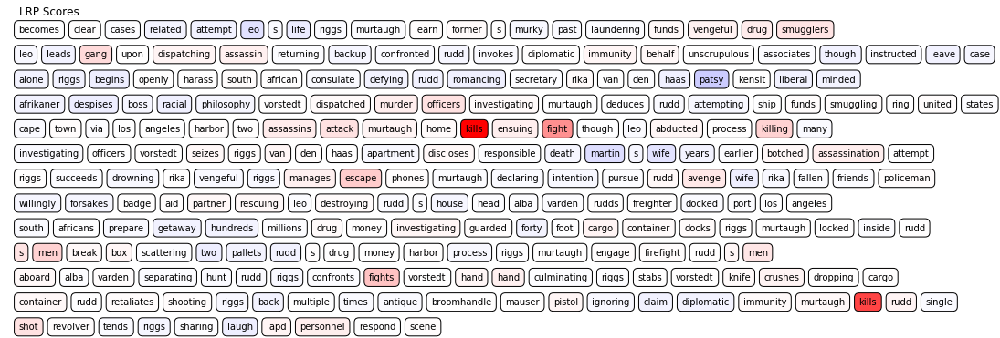

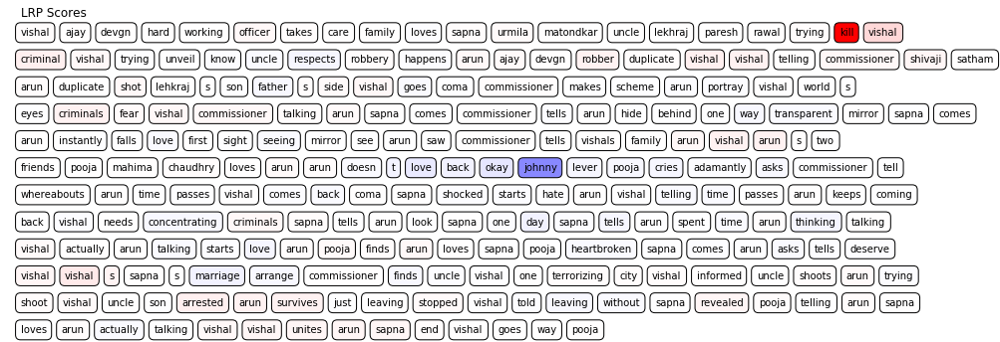

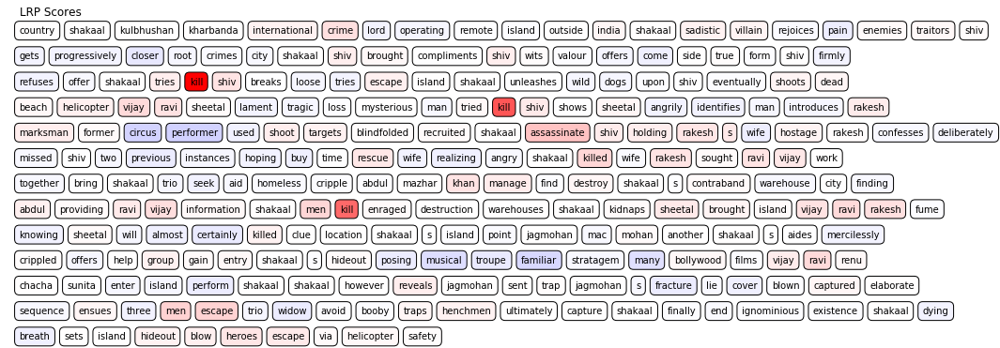

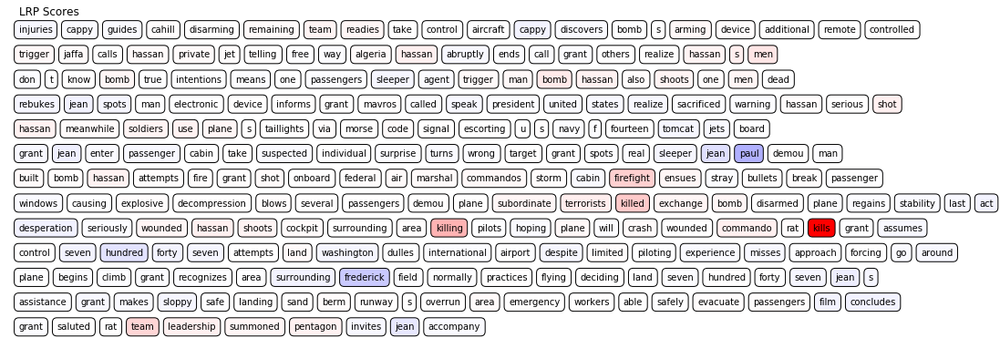

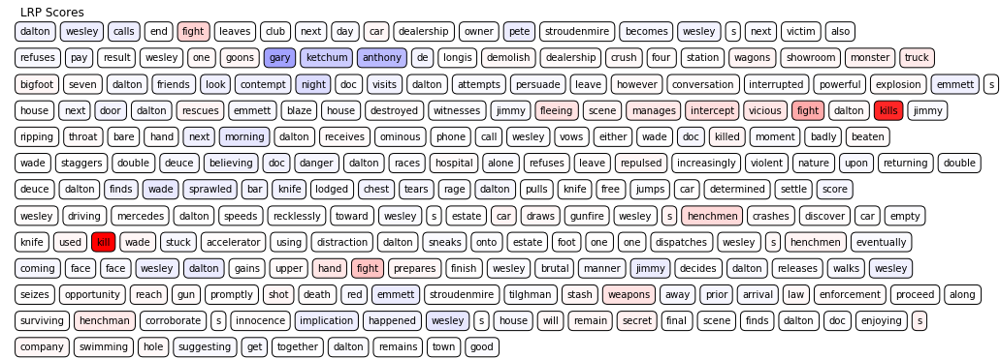

...

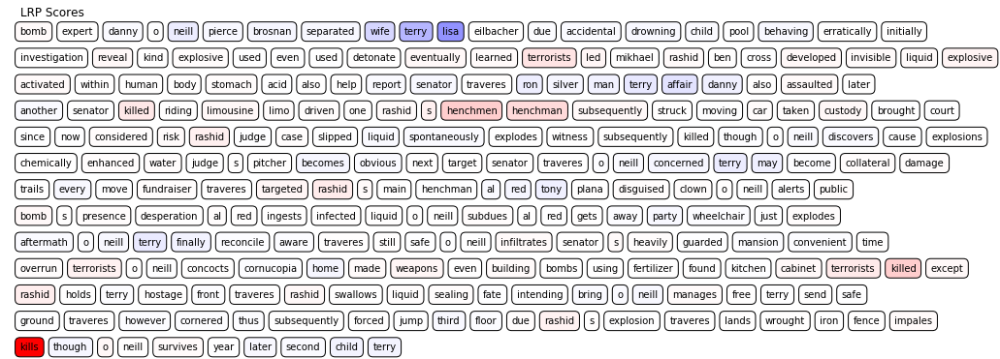

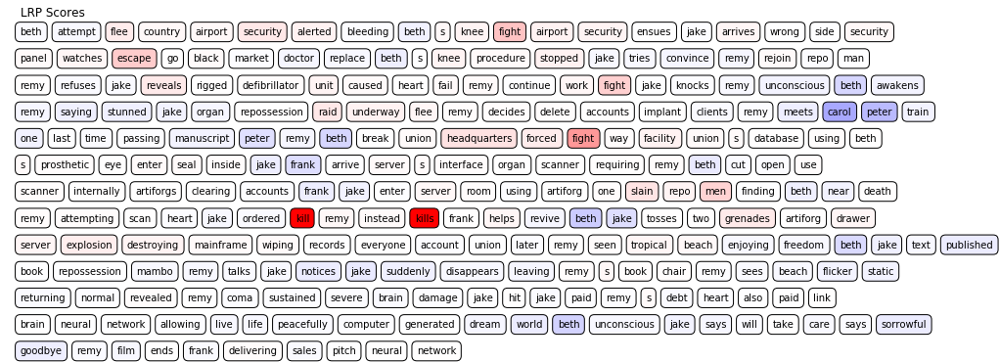

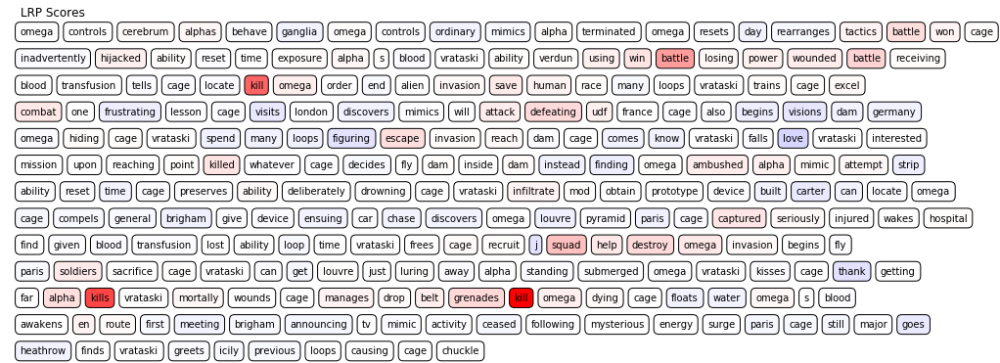

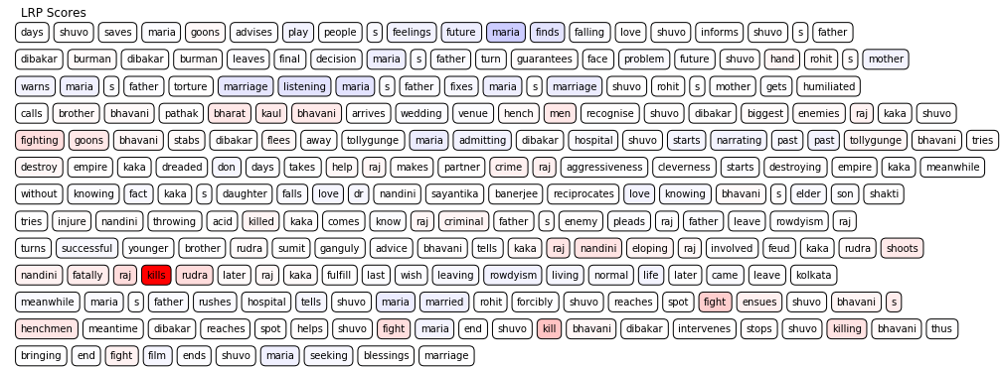

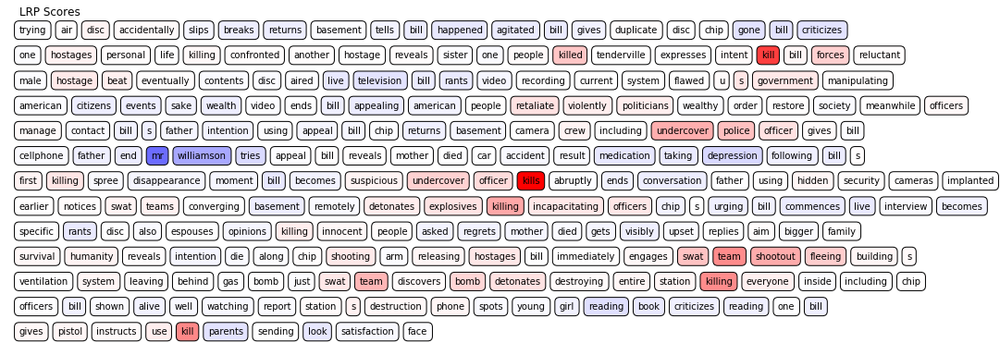

In [35]:
for i in np.arange(50):
    leni = pad_size - len(tp_text[i].split(' '))
    leni = np.max([leni, 0])
    plot_text_heatmap(tp_text[i].split(' ')[:pad_size],
                     np.array(result[i,leni:(pad_size+1)]),
                     "LRP Scores")
    plt.show()